In [152]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor 
from sklearn.metrics import mean_squared_error,r2_score

In [140]:
data=pd.read_csv('./air.csv')

In [31]:
#understand data
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


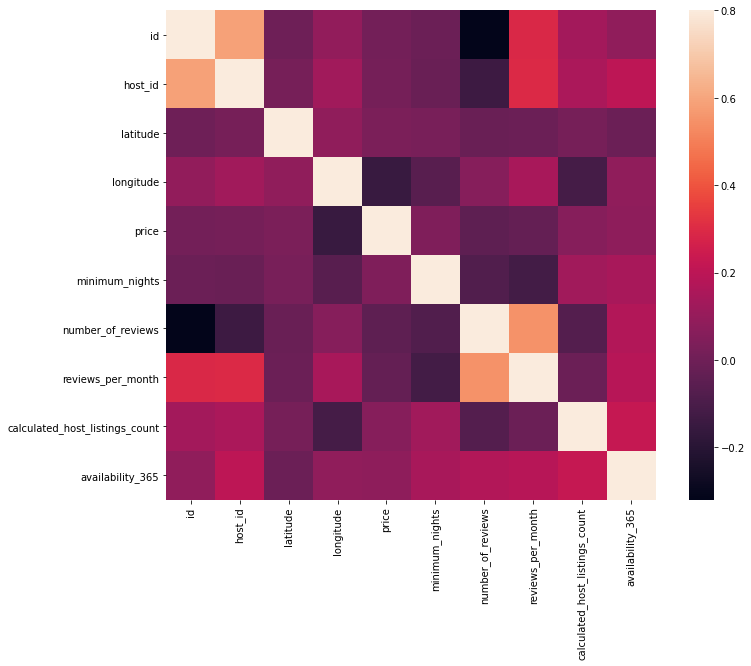

In [32]:
corrmat = data.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

In [33]:
data['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

# Data Viz

In [58]:

#Showing rent price per position in map
rentPriceMap = data[["latitude", "longitude","price"]]
#reduce length of data {CPU dead T_T}
rentPriceMap=rentPriceMap[:10000]

#Map putting start point at new city and zoom at 10
m = folium.Map([40.767937,-73.982155 ], zoom_start=10)

# mark each station as a point
for index, row in rentPriceMap.iterrows():
    #making circle for heat map {adding $ to the price}
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        popup=str(row['price'])+'$',
                        fill_color="#3db7e4", 
                       ).add_to(m)
    
    
rentPriceMap = rentPriceMap[['latitude', 'longitude']].to_numpy()
plt.figure(figsize=(14, 6))
sns.barplot(data.neighbourhood_group, data.price, hue=data.room_type, ci=None)
# plot heatmap
m.add_child(plugins.HeatMap(rentPriceMap, radius=25))
m


In [ ]:
#FastMarkerCluster(data[['latitude','longitude']],radius=10).add_to(cluster_map)

/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

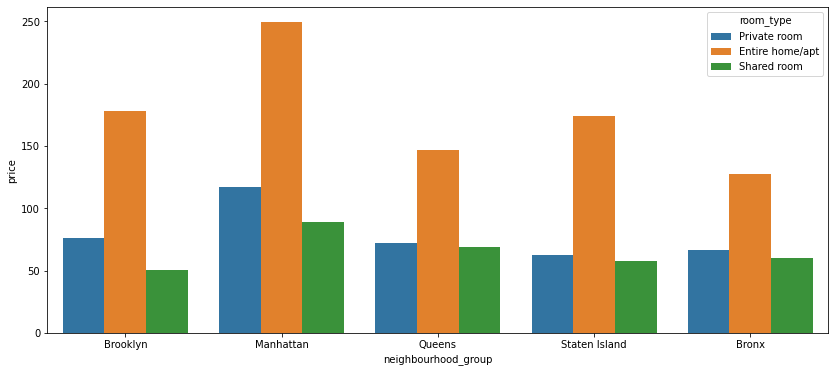

In [61]:
#print price/neighbourhood_group {room_type}
plt.figure(figsize=(14, 6))
sns.barplot(data.neighbourhood_group, data.price, hue=data.room_type, ci=None)

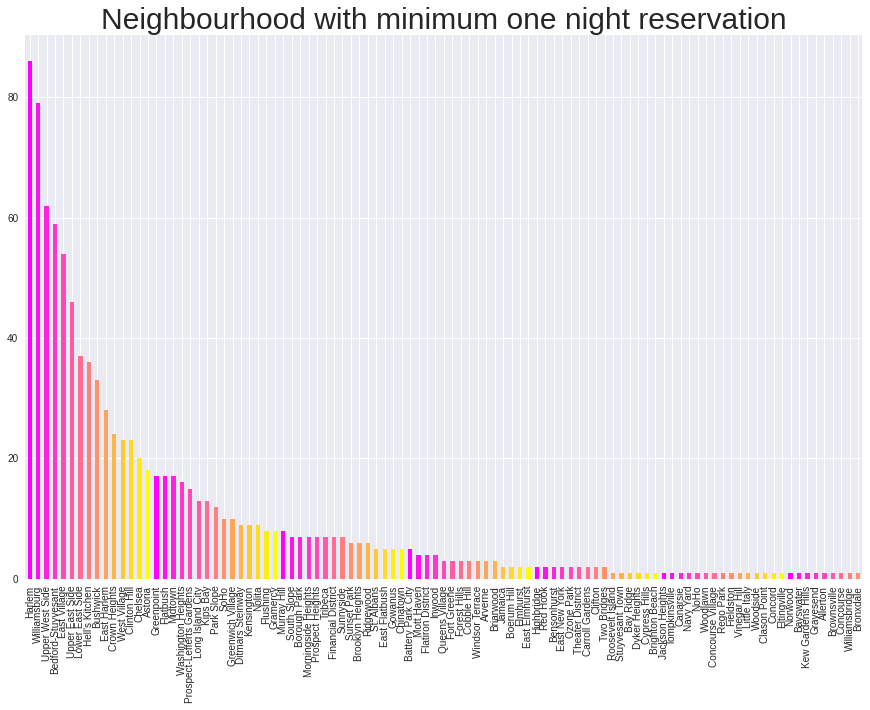

In [70]:
#plot neighbourhood with minimum one night reservation

neighbourhood=data.loc[data['minimum_nights'] == 1]
neighbourhood=neighbourhood['neighbourhood']
color = plt.cm.spring(np.linspace(0, 1, 15))
neighbourhood[:1000].value_counts().plot.bar(color = color, figsize = (15, 10))

plt.title('Neighbourhood with minimum one night reservation',fontsize = 30)

plt.xticks(rotation = 90)
plt.show()

# Data cleaning

In [71]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [128]:
dataclean = data[["neighbourhood_group","room_type","latitude", "longitude","minimum_nights","availability_365","price"]]
dataclean

,neighbourhood_group,room_type,latitude,longitude,minimum_nights,availability_365,price
0,Brooklyn,Private room,40.64749,-73.97237,1,365,149
1,Manhattan,Entire home/apt,40.75362,-73.98377,1,355,225
2,Manhattan,Private room,40.80902,-73.94190,3,365,150
3,Brooklyn,Entire home/apt,40.68514,-73.95976,1,194,89
4,Manhattan,Entire home/apt,40.79851,-73.94399,10,0,80
...,...,...,...,...,...,...,...
48890,Brooklyn,Private room,40.67853,-73.94995,2,9,70
48891,Brooklyn,Private room,40.70184,-73.93317,4,36,40
48892,Manhattan,Entire home/apt,40.81475,-73.94867,10,27,115
48893,Manhattan,Shared room,40.75751,-73.99112,1,2,55


In [129]:
#make sure that we don't have NaN columns
dataclean=dataclean.dropna()
dataclean.describe()

,latitude,longitude,minimum_nights,availability_365,price
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728949,-73.952170,7.029962,112.781327,152.720687
std,0.054530,0.046157,20.510550,131.622289,240.154170
min,40.499790,-74.244420,1.000000,0.000000,0.000000
25%,40.690100,-73.983070,1.000000,0.000000,69.000000
50%,40.723070,-73.955680,3.000000,45.000000,106.000000
75%,40.763115,-73.936275,5.000000,227.000000,175.000000
max,40.913060,-73.712990,1250.000000,365.000000,10000.000000


# Feature Engineering

In [130]:
#Encoding neighbourhood_group and room_type
le                                 = preprocessing.LabelEncoder()
dataclean2                         = dataclean
dataclean2['neighbourhood_group']  = le.fit_transform(dataclean2['neighbourhood_group'])
dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])
dataclean2

,neighbourhood_group,room_type,latitude,longitude,minimum_nights,availability_365,price
0,1,1,40.64749,-73.97237,1,365,149
1,2,0,40.75362,-73.98377,1,355,225
2,2,1,40.80902,-73.94190,3,365,150
3,1,0,40.68514,-73.95976,1,194,89
4,2,0,40.79851,-73.94399,10,0,80
...,...,...,...,...,...,...,...
48890,1,1,40.67853,-73.94995,2,9,70
48891,1,1,40.70184,-73.93317,4,36,40
48892,2,0,40.81475,-73.94867,10,27,115
48893,2,2,40.75751,-73.99112,1,2,55


# Model Tunning

In [131]:
X = dataclean2[[col for col in list(dataclean2.columns) if col != 'price'] ]
X_train, X_test, Y_train, Y_test = train_test_split(X,y,random_state = 32, test_size = 0.3) 

In [132]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 238.05550364677114
R2 score is 8.15526494113743


The model performance for testing set
--------------------------------------
RMSE is 208.55862643582833
R2 score is 9.890527175086417


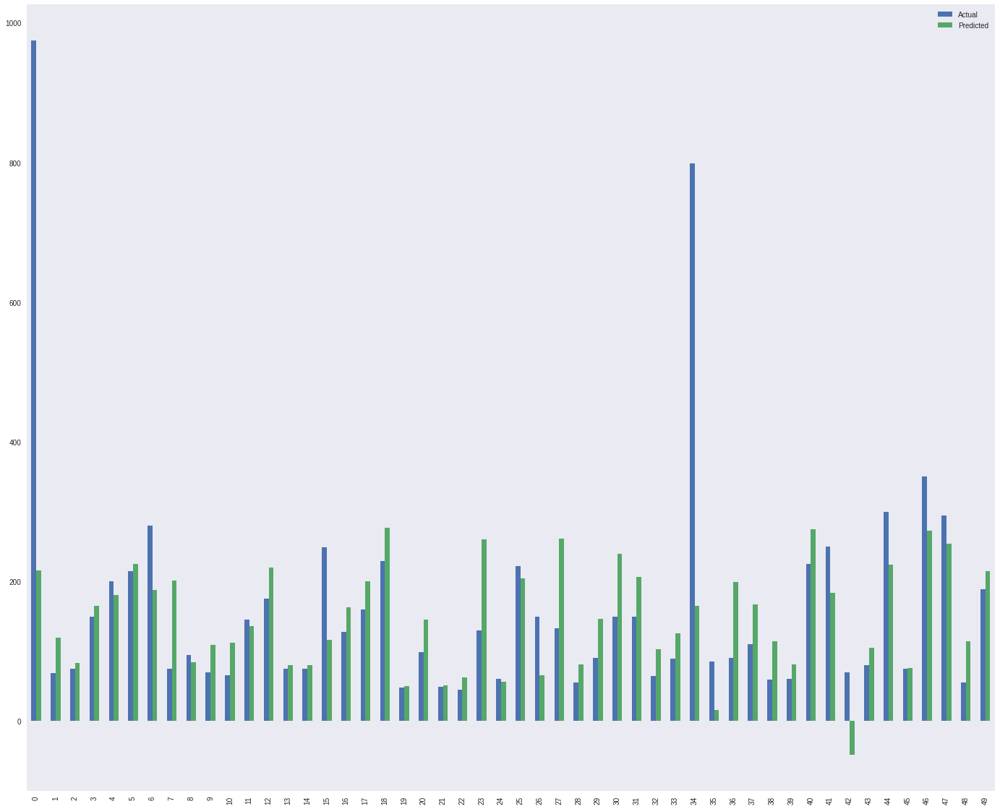

In [133]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

# Model Validation

In [135]:
Q1 = dataclean2.quantile(0.25)
Q3 = dataclean2.quantile(0.75)
IQR = Q3 - Q1
IQR_df = dataclean2[~((dataclean2 < (Q1 - 1.5 * IQR)) |(dataclean2 > (Q3 + 1.5 * IQR))).any(axis=1)]


In [136]:
Y = IQR_df['price']
X = IQR_df[['neighbourhood_group', 'longitude', 'room_type', 'availability_365']]
X = preprocessing.normalize(X)
X = np.hstack((np.ones( (len(IQR_df['price']) ,1)), X))


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

In [137]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 55.60330412330963
R2 score is 31.67873098985985


The model performance for testing set
--------------------------------------
RMSE is 56.437512847890844
R2 score is 30.840152765193007


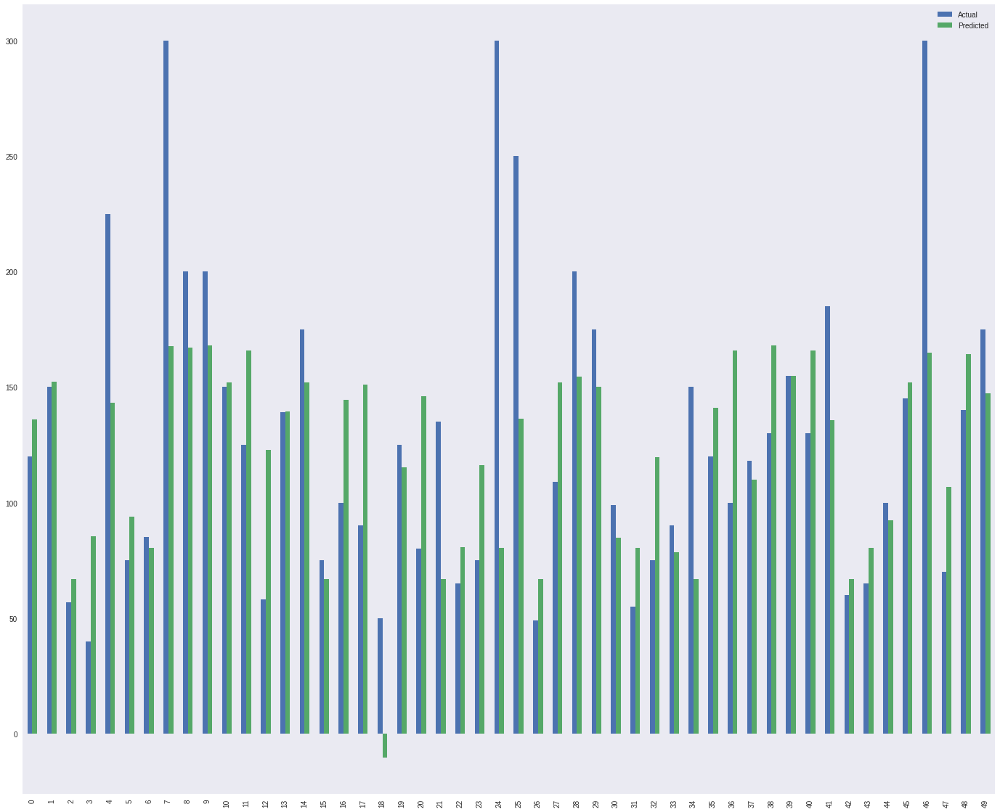

In [138]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [146]:
clf = LogisticRegression(random_state=42,max_iter=1000).fit(X_train, Y_train)

In [148]:
y_train_predict = clf.predict(X_train)
clf.score(X_train, Y_train)

0.055704265916714665

In [153]:
xgb_reg = XGBRegressor(n_estimators=1000)
xgb_reg.fit(X_train, Y_train, early_stopping_rounds=5, 
             eval_set=[(X_test, Y_test)], verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [154]:
xgb_reg = XGBRegressor(learning_rate=0.3,
                      n_estimators=1000,
                      max_depth=6, min_child_weight=1)

xgb_reg_cv = -rmse_cv(xgb_reg)

xgb_reg.fit(X_train, y_train)
xgb_pred_train = xgb_reg.predict(X_train)
xgb_pred_test = xgb_reg.predict(X_test)

xgb_reg_results = model_scores(xgb_reg, xgb_reg_cv, y_train, y_test, xgb_pred_train, xgb_pred_test)

xgb_reg_results.style.hide_index()

NameError: name 'rmse_cv' is not defined